In [1]:
import os

import pandas as pd
from datetime import datetime

import matplotlib.pyplot as plt

from glob import glob
from tqdm import tqdm_notebook as tqdm

import pickle

In [2]:
NOMINAL_FILTERED_FILES = "filtered/nominal_*.csv"

In [3]:
def plot_profiles(df, metadata=None):
    plt.figure(figsize=(15,5))
    if metadata is not None:
        vid = metadata['VehicleID']
        rel = metadata['Relative Error (%)']
        com = metadata["Comment"]
        plt.title(f"Speed profiles - VehicleID {vid}, Relative Error = {rel}, reason: {com}")
    plt.plot(df["axle1RawSpeed"], label="axle1RawSpeed")
    plt.plot(df["axle2RawSpeed"], label="axle2RawSpeed")
    plt.plot(df["trainSpeed"], label="trainSpeed")
    plt.legend()
    plt.show()

In [4]:
def save_event(df, metadata, output_name):
    dirname = os.path.dirname(output_name)
    if not os.path.isdir(dirname):
        os.makedirs(os.path.dirname(dirname), exist_ok=True)
    with open(output_name, "wb") as f:
        pickle.dump({"data":df, "metadata":metadata}, f)

In [5]:
dfs = [pd.read_csv(f, nrows=None) for f in glob(NOMINAL_FILTERED_FILES)]

In [6]:
full_diag = pd.concat(dfs, sort=True)

c:\users\424270\appdata\local\programs\python\python37\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


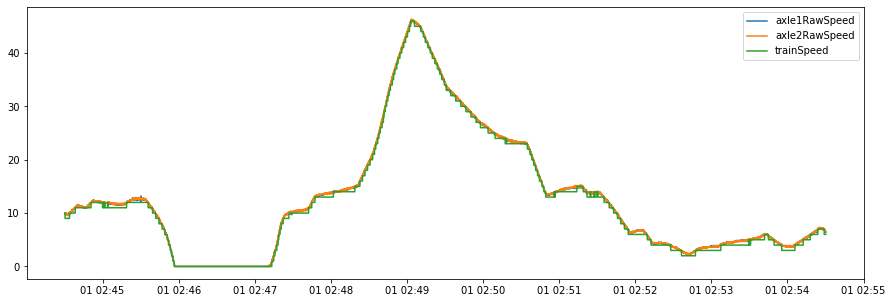

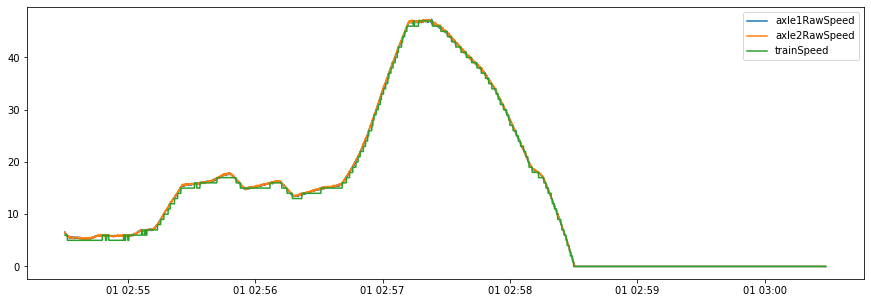

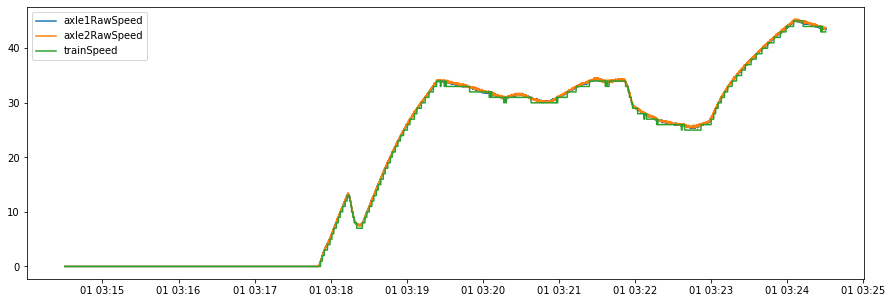

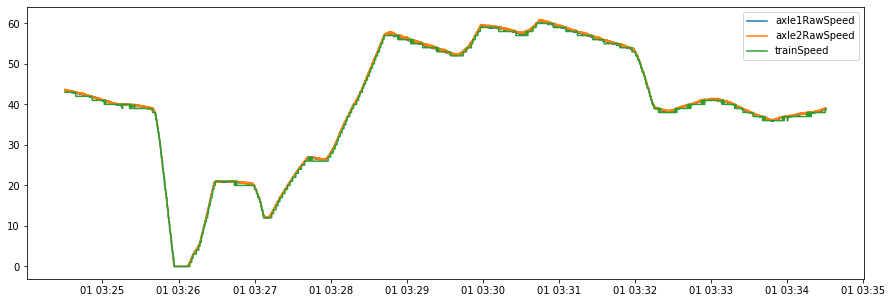

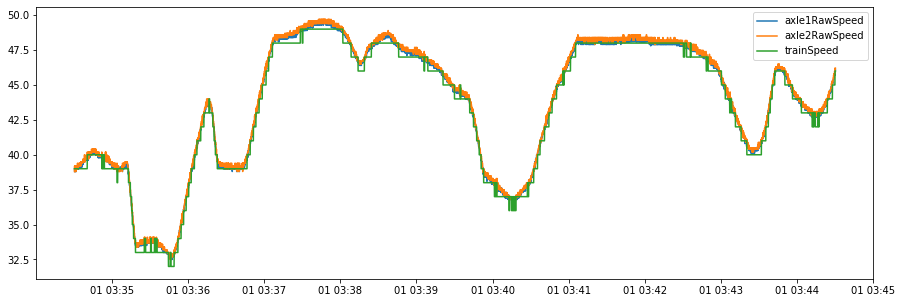

...

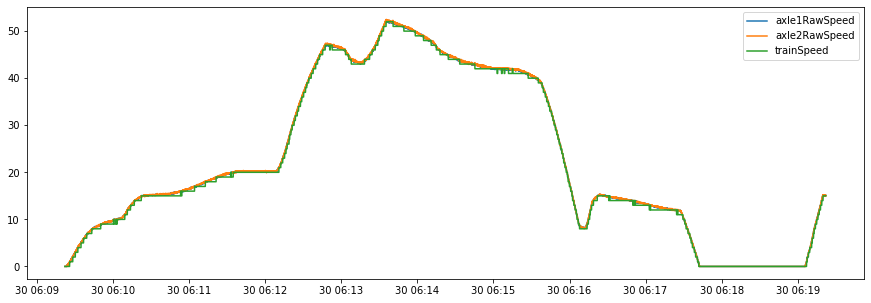

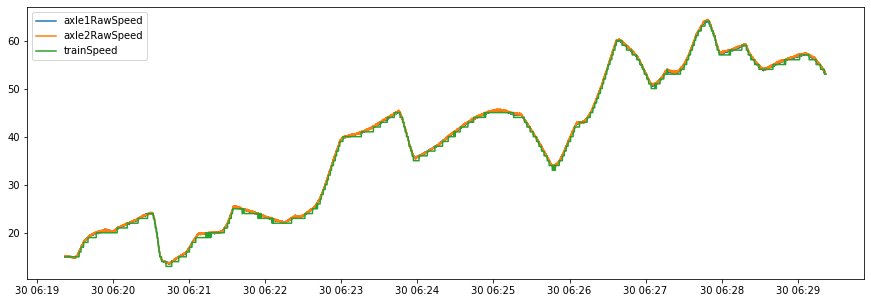

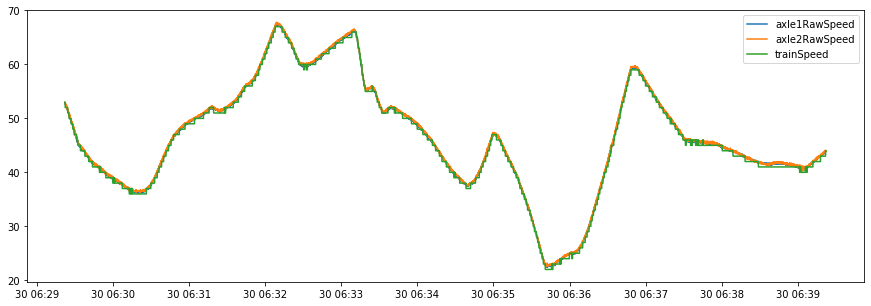

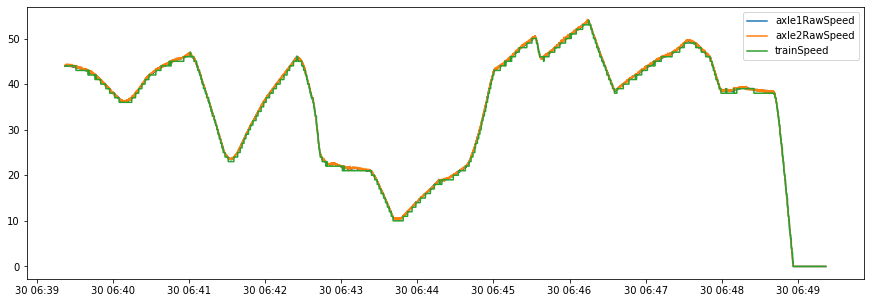

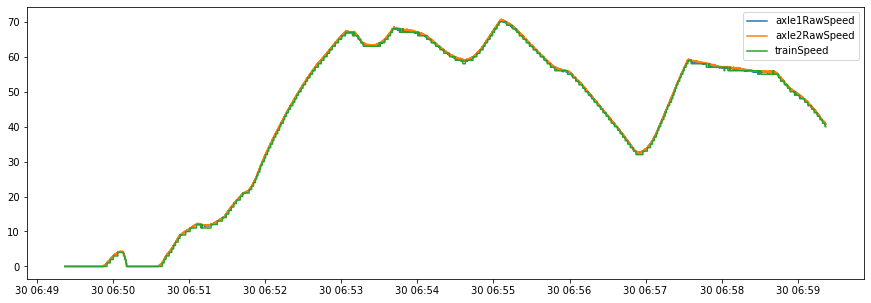

In [7]:
for f in glob(NOMINAL_FILTERED_FILES):
    
    df = pd.read_csv(f, nrows=None) 
    
    df["TimeStamp"] = pd.to_datetime(df["TimeStamp"])
    df = df.set_index("TimeStamp")
    df = df.sort_index()

    df["axle1RawSpeed"] /= 10
    df["axle2RawSpeed"] /= 10
#     df["trainSpeed"] *= 10
#     df["axle1RawSpeed"] = df["axle1RawSpeed"].astype(int)
#     df["axle2RawSpeed"] = df["axle2RawSpeed"].astype(int)


    vid = "_".join(f.split("\\")[-1].split("_")[:2])
    
    begin = df.index.min()
    end = begin + pd.Timedelta(minutes=10)
    
    while(end < df.index.max()):
        df_event = df[begin:end].copy()
        ts = end.strftime("%Y-%m-%d--%H-%M-%S%f")

        if 0 in df_event["trainSpeed"].value_counts().keys():
            if df_event["trainSpeed"].value_counts()[0]/df_event["trainSpeed"].shape[0] > 0.4:
                begin = end
                end = begin + pd.Timedelta(minutes=10)
                continue
            else:
                plot_profiles(df_event)
                save_event(df_event, None, f"events/{vid}_{ts}.pkl")
                begin = end
                end = begin + pd.Timedelta(minutes=10)
                continue
        else:
            plot_profiles(df_event)
            save_event(df_event, None,  f"events/{vid}_{ts}.pkl")
            begin = end
            end = begin + pd.Timedelta(minutes=10)
        
        
#     break